## Exploratory data analysis of the Quandl rent data

In [1]:
import folium
from shapely.geometry import Point
import geopandas as gpd
import matplotlib.pyplot as plt

First read in data

In [2]:
rent_polys_df = gpd.read_file("processed/rent_data.shp")

Let's first look at the distribution of median rent per square foot by zipcode in LA:

In [3]:
rent_polys_df[['rent_psf']].describe()

,rent_psf
count,228.000000
mean,2.268857
std,0.531403
min,1.487667
25%,1.930458
50%,2.122000
75%,2.402250
max,4.829333


The mean (\\$2.27) is a bit higher than the median (\\$2.40) indicating that rental prices are right skewed. Let's look at the histogram

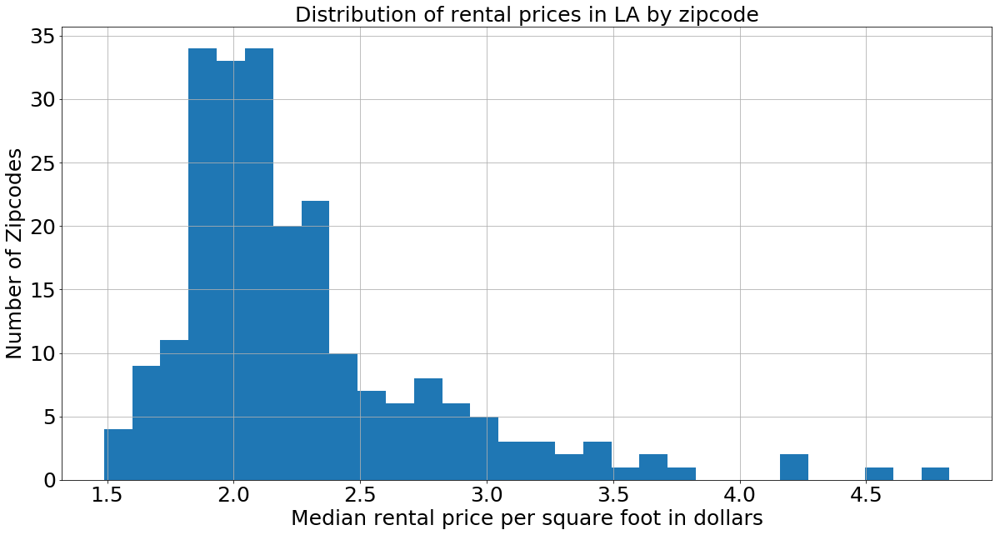

In [4]:
rent_polys_df[['rent_psf']].hist(bins=30, figsize=(20,10))
plt.xlabel("Median rental price per square foot in dollars", fontsize=25)
plt.ylabel("Number of Zipcodes", fontsize=25)
plt.title("Distribution of rental prices in LA by zipcode", fontsize=25)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.show()

Again, a bit right skewed, with most zipcodes around \\$2 psf
Next, I'll make a choropleth map with the zipcode polygons. A few zipcodes didn't have rental data on quandl, so those areas are not colored in green:

In [5]:
la_coords = [34.0522, -118.2437]#coordinates for LA 
la_map = folium.Map(location=la_coords, zoom_start=10, tiles='cartodbpositron')
la_map.choropleth(
    geo_data=rent_polys_df.to_json(),
    fill_opacity=0.8, 
    fill_color='YlGn',
    line_opacity=0.2,
    data=rent_polys_df,
    columns=['zipcode','rent_psf'],
    key_on='feature.properties.zipcode',
    legend_name='Median rent per square foot ($, from Zillow)',
    highlight=True)
la_map

## Conclusion

 - It seems that Santa Monica, Beverly Hills, and West Hollywood are all relatively high priced in terms of rent. The coast is also more expensive than inland, as one would expect. The Eastern and Northern portions of LA are considerably cheaper.

 - The distribution of rent prices in LA is moderately right-skewed, with a mean of \\$2.3 psf and median of \\$2.1 psf. The upper end of rent is around 5 \\$ psf.